# audio-plot-lib

Python library to converts a graph data to sound on Google Colab. Values are represented by pitches, and the timeline is represented by left and right pans. It was created to make data science fun for the visually impaired.

Note that when the session expires, the plot must be rerun as well, or the sound will not be heard.

# Setup for screen reader user

In [1]:
!pip install colab-a11y-utils
from colab_a11y_utils import set_sound_notifications
set_sound_notifications()

# Install

In [2]:
# stable
#!pip install audio-plot-lib

# latest
!pip install --upgrade git+https://github.com/hassaku/audio-plot-lib.git

  Cloning https://github.com/hassaku/audio-plot-lib.git to /tmp/pip-req-build-0is8axws
  Running command git clone -q https://github.com/hassaku/audio-plot-lib.git /tmp/pip-req-build-0is8axws
  Created wheel for audio-plot-lib: filename=audio_plot_lib-0.0.3-cp36-none-any.whl size=7223 sha256=c954dffc2c14060bead595f02523e26934f3688e7e16b6e1e5d8ade29ba1d6f0
  Stored in directory: /tmp/pip-ephem-wheel-cache-s8cwf9_b/wheels/7d/ed/be/62d1f6b8bc8c2e9af7f578ff3d362dcdc4f2d43db607182431
Successfully built audio-plot-lib
  Found existing installation: audio-plot-lib 0.0.3
    Uninstalling audio-plot-lib-0.0.3:
      Successfully uninstalled audio-plot-lib-0.0.3


In [3]:
import audio_plot_lib as apl

# Intaractive plot

## Basic usage

In [4]:
apl.interactive.plot([0, 1, 2, 3, 2, 1, 0])

## Multiple group of data

In [5]:
data1 = [0, 1, 2, 3, 2, 1, 0]
label1 = [0, 0, 0, 0, 0, 0, 0]
data2 = [3, 2, 1, 0, 1, 2, 3]
label2 = [1, 1, 1, 1, 1, 1, 1]
apl.interactive.plot(data1 + data2, label=label1 + label2)

## Simple example in machine learning


In [6]:
import numpy as np
from sklearn.linear_model import LogisticRegression

data = []  # 2 dimentional array of x1, x2
label = []  # list of classification number of 0 or 1

# sample 1
data.append([0.2, 0.4])
label.append(0)

# sample 2
data.append([0.5, 0.3])
label.append(0)

# sample 3
data.append([0.5, 0.9])
label.append(1)

# sample 4
data.append([0.7, 0.8])
label.append(1)

# convert data to numpy to handle with scikit learn
data = np.array(data)
label = np.array(label)

# classification by machine learning
classifier = LogisticRegression().fit(data, label)
slope = classifier.coef_[0][0]
intercept = classifier.coef_[0][1]
decision_boundary_x = np.arange(0, 1, 0.1)
decision_boundary_y = slope * decision_boundary_x + intercept

plot_data_x = data[:, 0].tolist() + decision_boundary_x.tolist()
plot_data_y = data[:, 1].tolist() + decision_boundary_y.tolist()
plot_label = label.tolist() + [2]*len(decision_boundary_x) # 0 and 1 are label of data. 2 is decision boundary

apl.interactive.plot(y=plot_data_y, x=plot_data_x, label=plot_label,
                     margin_x=0.1, title="linear regression")

## prediction

In [7]:
new_data = np.array([[0.3, 0.7]])
prediction = classifier.predict(new_data)

print(f"predicted label of x1:{new_data[0][0]} and x2:{new_data[0][1]} is {prediction[0]}")

predicted label of x1:0.3 and x2:0.7 is 1


## Parameters

By specifying width and height, you can change the size of the graph image; by specifying margin_x, you can adjust the timing of sound emission for a point on the graph; by specifying title, you can change the name of the text to be read out when the mouse is over the image. By specifying title, you can change the name that is read out loud when the mouse enters the image.


In [8]:
apl.interactive.plot([0, 1, 2, 3, 4, 5, 4, 3, 2, 1, 0], width=500, height=100, margin_x=0.1, title="parameters graph")

# Playable plot

In [9]:
import matplotlib.pyplot as plt

## Basic usage

In [10]:
apl.playable.plot([0, 1, 2, 3, 2, 1, 0], duration=500)

## Parameters

Note that the parameters are not compatible with those of interactive.plot.

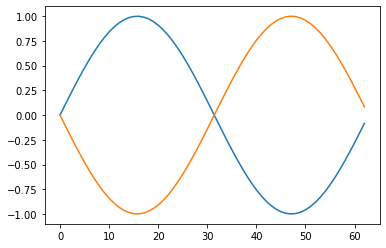

In [11]:
sin = np.sin(np.arange(0, np.pi*2, 0.1))  # 0,  0.09983342,  0.19866933,  0.29552021,  0.38941834, ...
two_inverted_sin = np.array([sin, -1 * sin]).T

plt.plot(two_inverted_sin)
apl.playable.plot(two_inverted_sin, ptype="overlay")

In [12]:
import pandas as pd
df = pd.read_csv("https://raw.githubusercontent.com/nytimes/covid-19-data/master/us-states.csv")
new_york = df[(df.state == "New York") & (df.date > "2020-03-01")].cases.values
texas = df[(df.state == "Texas") & (df.date > "2020-03-01")].cases.values

new_york_and_texas_cases_since_march = np.array([new_york, texas]).T

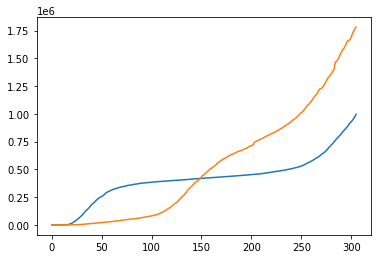

In [13]:
plt.plot(new_york_and_texas_cases_since_march)
apl.playable.plot(new_york_and_texas_cases_since_march, labels=["new york", "texas"])